<a href="https://colab.research.google.com/github/sjsoumil/Projects/blob/main/Dog_breed_identification_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#!unzip "/content/drive/MyDrive/DOG/dog-breed-identification.zip" -d "/content/drive/MyDrive/DOG/"

# End to End Muti-Class Dog Breed Classification

This notebook builds an end to end multi class image classifier using tensorflow 2.0 and tensorflow hub

## 1.Problem
Identifying the breed of a dog given an image
## 2.Data
the data i'm using is from kaggle's dog breed
identification competition.
## 3.Evaluation
 The evaluation is a file with prediction probabilities for each dog breed of each dog image
## 4.features
some info about data
* we're dealing with images (unstructured data) so  we will use deep learning/transfer learning
* There are 120 breeds of digs
* there are around 10,000+ images in the training set
* there are 10k+ images in test set


## getting our workspace ready


In [ ]:
import tensorflow as tf
import tensorflow_hub as hub

print("Tf version",tf.__version__)
print("TF Hub version",hub.__version__)

# check for GPU availability
print("GPU","available(YESS!!!)" if tf.config.list_physical_devices("GPU")else "not available")

Tf version 2.12.0
TF Hub version 0.14.0
GPU available(YESS!!!)


## Getting our data ready

with all machine learning models ,our data has to be numerical format.images to tensor(numerical representation).

In [ ]:

import pandas as pd
labels_csv=pd.read_csv("/content/drive/MyDrive/DOG/labels.csv")

print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


<Axes: >

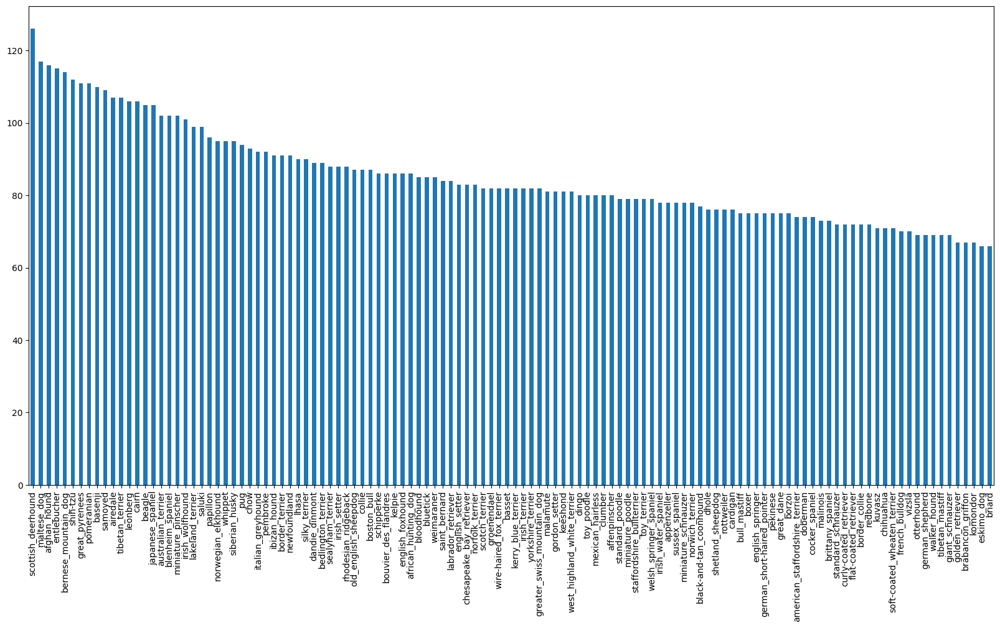

In [ ]:

labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

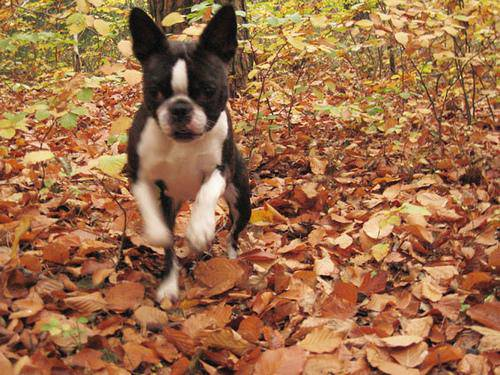

In [ ]:
from IPython.display import Image
Image("/content/drive/MyDrive/DOG/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

### Getting image  and their labels
lets get a list of all our image file pathnames

In [ ]:
# create path name from Image ID's

filename=["/content/drive/MyDrive/DOG/train/"+fname+".jpg" for fname in labels_csv["id"] ]
filename[:5]

['/content/drive/MyDrive/DOG/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/DOG/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/DOG/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/DOG/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/DOG/train/0021f9ceb3235effd7fcde7f7538ed62.jpg']

In [ ]:
# check number of filename matches actual images files
import os
if len(os.listdir("/content/drive/MyDrive/DOG/train/"))==len(filename):
  print("Filenames matches the actual amount of files!!")
else:
  print("Filenames do not match")

Filenames matches the actual amount of files!!


In [ ]:
import numpy as np
labels=labels_csv["breed"].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
if len(labels)==len(filename):
  print("Number of label macthes number of filenames")
else:
  print("Number of matches number of filenames")


Number of label macthes number of filenames


In [ ]:
unique_breeds=np.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turn every label into boolean array
boolean_labels=[label==unique_breeds for label in labels]
boolean_labels[:2]


[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

### Creating our own validation set


In [ ]:
# setup x and y variables
x=filename
y=boolean_labels

In [ ]:
len(x)==len(y)

True

In [ ]:

# set number of images to use for experimenting

NUM_IMAGES=1000 #param{type:"slider",min:1000,max:10000,step:1000}

In [ ]:

from sklearn.model_selection import train_test_split
np.random.seed(42)

x_train,x_val,y_train,y_val=train_test_split(x[:NUM_IMAGES],
                                            y[:NUM_IMAGES],
                                            test_size=0.2,random_state=42)

len(x_train),len(y_train),len(x_val),len(y_val)

(800, 800, 200, 200)

## Preprocessing Images(turning images into tensors)

1. Take an image filepath as input
2. Use tensorflow to read the file and save it to avariable image
3. turn our image into tensor
4. Resize the image to ba a shape of (224,224)
5. Return modified image

In [ ]:
# convert image to numpy array
from matplotlib.pyplot import imread
image=imread(filename[42])
image.shape




(257, 350, 3)

In [ ]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [ ]:

IMG_SIZE = 224

def process_image(image_path):
    image = tf.io.read_file(image_path)  # Fixed typo: tf.io.read.file -> tf.io.read_file
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.convert_image_dtype(image, tf.float32)
    image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

    return image





## Turning data into batches

In [ ]:
# create a simple function to return a tuple (image,label)

def get_image_label(image_path,label):
  image=process_image(image_path)
  return image,label



In [ ]:
(process_image(x[42]),y[42])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [ ]:
BATCH_SIZE=32
def create_data_batches(x,y=None,batch_size=BATCH_SIZE,valid_data=False,test_data=False ):
  if test_data:
    print("Create test data batches")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x)))
    data_batch=data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  elif valid_data:
    print("Creating validation data batches")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x),tf.constant(y)))

    data_batch=data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  else:
    print("Creating training data batches")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x),tf.constant(y)))

    data=data.shuffle(buffer_size=len(x))

    data=data.map(get_image_label)

    data_batch=data.batch(BATCH_SIZE)
  return data_batch




In [ ]:
#creating training and validation data batches
train_data=create_data_batches(x_train,y_train)
val_data=create_data_batches(x_val,y_val,valid_data=True)

Creating training data batches
Creating validation data batches


In [ ]:
train_data.element_spec,val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [ ]:
import matplotlib.pyplot as plt

#create a fucntion for viewing image in a data batch
def show_25_images(images,labels):
  plt.figure(figsize=(10,10))
  for i in range(25):
    ax=plt.subplot(5,5,i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])

In [ ]:
unique_breeds[y[0].argmax()]

'boston_bull'

In [ ]:
train_images,train_labels=next(train_data.as_numpy_iterator())
len(train_images),len(train_labels)

(32, 32)

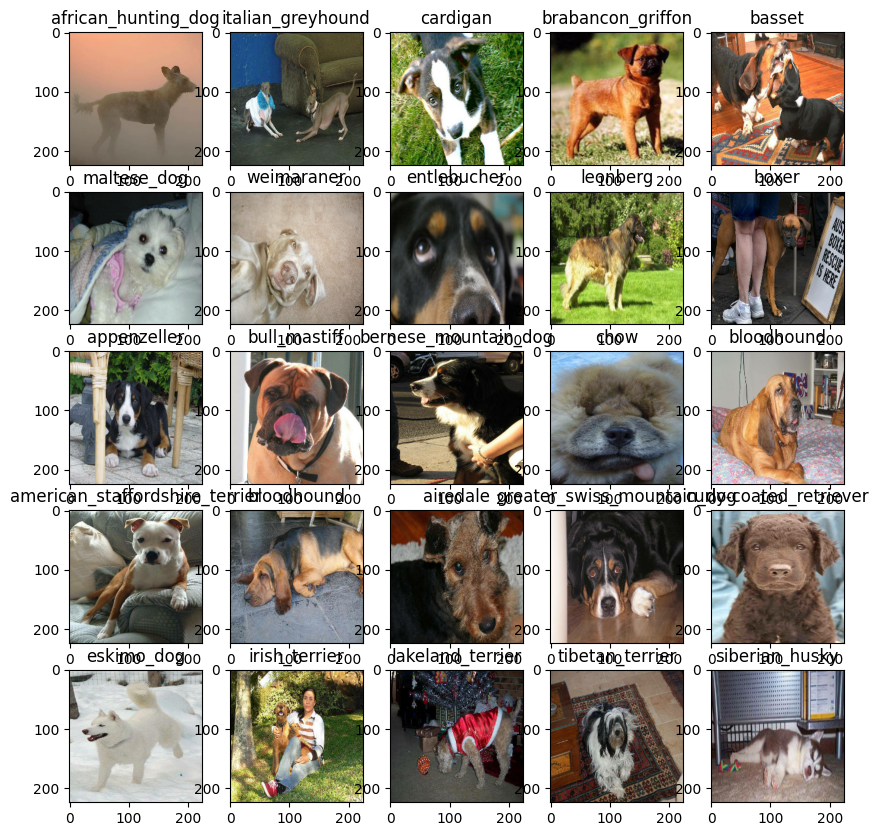

In [ ]:
train_images,train_labels=next(train_data.as_numpy_iterator())
show_25_images(train_images,train_labels)

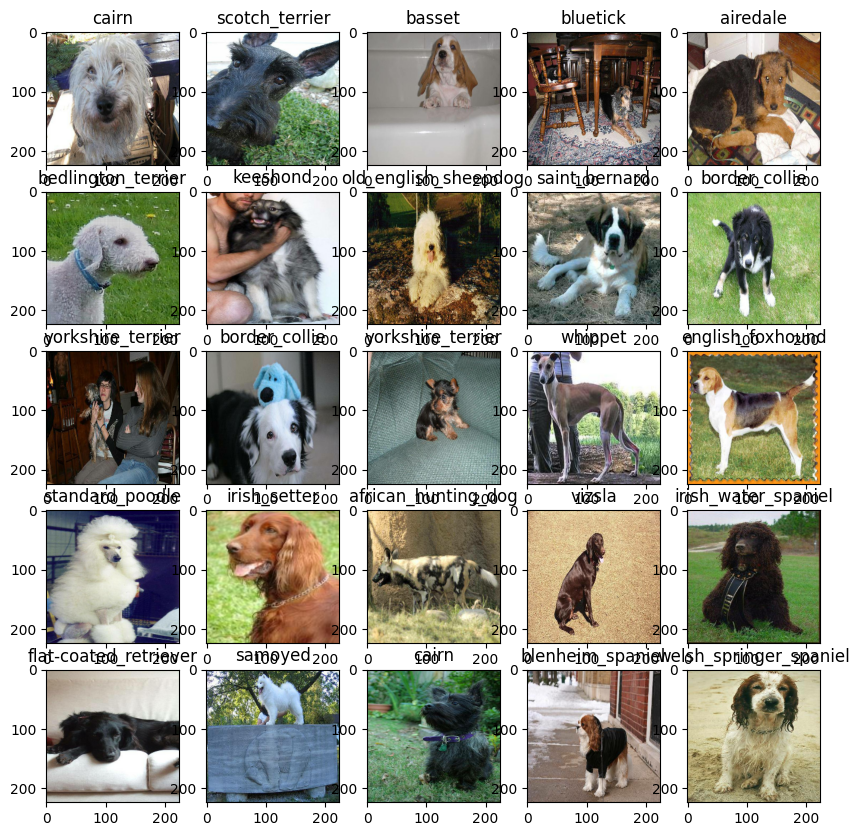

In [ ]:
val_images,val_labels=next(val_data.as_numpy_iterator())
show_25_images(val_images,val_labels)

## Building model
before we build a model,there are few things we need to define:
* The input shape (our image shape,in the form of Tensors) to our model.
* The output shape (image labels,in the form of Tensors) of our model
* The URL of the model we want to use


In [ ]:
INPUT_SHAPE=[None,IMG_SIZE,IMG_SIZE,3] #batch,height,width,colour channels
OUTPUT_SHAPE=len(unique_breeds)
#Setup model URL from Tensorflow Hub
MODEL_URL= "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"


 Now we have got our inputs ,outputs and model ready to go putting them together into a keras deep learning model
  

In [ ]:
 # Create a function which builds keras model
def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE,model_url=MODEL_URL):
  print("Building model with :",MODEL_URL)

  model=tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL),
      tf.keras.layers.Dense(units=OUTPUT_SHAPE, activation="softmax")

  ])

  #Compile
  model.compile(
      loss=tf.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]

  )

  model.build(INPUT_SHAPE)

  return model

In [ ]:
model=create_model()
model.summary()

Building model with : https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks

In [ ]:
%load_ext tensorboard

In [ ]:
import datetime
# create a function to build  Tensorboard callback
def create_tesnorboard_callbacks():
  logdir=os.path.join("/content/drive/MyDrive/DOG/logs",
                      datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

  return tf.keras.callbacks.TensorBoard(logdir)



### Early stopping callback

In [ ]:
early_stopping=tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",patience=3)

## Training our model(on a subset of data)


In [ ]:
NUM_EPOCHS=100#@param{type:"slider",min:10,max=100,step:10}

In [ ]:
print("GPU","available(YESSS) " if tf.config.list_physical_devices("GPU")else "not available")

GPU available(YESSS) 


# Create a fucntion which trains a model


In [ ]:
def train_model():
  model=create_model()
  tensorboard=create_tesnorboard_callbacks()
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard,early_stopping])
  return model


In [ ]:
model=train_model()


Building model with : https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 100s 335ms/step - loss: 4.5954 - accuracy: 0.0875 - val_loss: 3.4598 - val_accuracy: 0.2550
Epoch 2/100
25/25 [==============================] - 6s 257ms/step - loss: 1.6304 - accuracy: 0.6787 - val_loss: 2.1611 - val_accuracy: 0.4500
Epoch 3/100
25/25 [==============================] - 3s 119ms/step - loss: 0.5710 - accuracy: 0.9337 - val_loss: 1.6879 - val_accuracy: 0.5750
Epoch 4/100
25/25 [==============================] - 4s 162ms/step - loss: 0.2496 - accuracy: 0.9912 - val_loss: 1.5153 - val_accuracy: 0.6450
Epoch 5/100
25/25 [==============================] - 3s 131ms/step - loss: 0.1454 - accuracy: 0.9962 - val_loss: 1.4376 - val_accuracy: 0.6500
Epoch 6/100
25/25 [==============================] - 4s 146ms/step - loss: 0.1004 - accuracy: 1.0000 - val_loss: 1.3941 - val_accuracy: 0.6550
Epoch 7/100
25/25 [===========================

In [ ]:
%tensorboard --logdir /content/drive/MyDrive/DOG/logs

<IPython.core.display.Javascript object>

In [ ]:
## Making and evaluating predictions using trained model

predictions=model.predict(val_data,verbose=1)
predictions

7/7 [==============================] - 2s 154ms/step


array([[5.80202963e-04, 2.43904196e-05, 1.11239823e-03, ...,
        2.19883383e-04, 4.33721580e-05, 5.35531493e-04],
       [2.68584350e-04, 3.63697443e-04, 5.24143782e-03, ...,
        6.04809204e-04, 6.30164985e-03, 1.05684943e-04],
       [3.91977082e-05, 5.19694993e-04, 1.74232719e-06, ...,
        1.75085384e-04, 5.47011441e-05, 6.33344578e-04],
       ...,
       [2.16503049e-05, 4.89196573e-05, 1.15265902e-04, ...,
        5.01964205e-05, 6.27937261e-05, 6.48554415e-05],
       [9.30448808e-03, 7.75322260e-05, 7.45313737e-05, ...,
        4.93315711e-05, 1.07838154e-04, 3.31628602e-03],
       [7.16824026e-04, 9.49842288e-05, 3.56279546e-03, ...,
        6.61754375e-03, 1.40496588e-03, 1.93376909e-04]], dtype=float32)

In [ ]:
#First predition
index=42
print(predictions[0])
print(f"Max value (Probability of predictions):{np.max(predictions[index])}")
print(f"SUM:{np.sum(predictions[index])}")
print(f"Max Index:{np.argmax(predictions[index])}")
print(f"Predicted label:{unique_breeds[np.argmax(predictions[index])]}")

[5.80202963e-04 2.43904196e-05 1.11239823e-03 1.39664829e-04
 5.84561436e-04 1.99551978e-05 4.28338498e-02 2.38335284e-04
 3.92600865e-04 2.37875921e-03 1.16436556e-03 4.50231804e-04
 1.38790638e-04 4.78125439e-05 2.14574000e-04 2.92952987e-04
 2.97835031e-05 9.89085138e-02 2.26348984e-05 5.25393079e-05
 9.48359608e-04 8.34896782e-05 4.12125846e-05 9.18245525e-04
 5.79335683e-05 3.41860577e-05 3.25988591e-01 4.04418315e-05
 8.89215618e-04 1.09033706e-03 1.35906434e-04 2.65466457e-04
 8.88494309e-04 5.73765283e-05 8.67901981e-05 9.59237851e-03
 5.52445226e-06 1.46090824e-04 4.94400119e-05 4.76141504e-05
 5.14114159e-04 1.30538810e-05 6.60309088e-05 3.21188243e-04
 5.76117736e-06 4.29220672e-04 5.63737012e-05 2.09950696e-04
 6.32120413e-04 4.55382193e-04 1.73033244e-04 4.03168342e-05
 4.16361814e-04 3.61182101e-05 1.54529145e-04 3.71797396e-05
 2.56325613e-04 2.23018252e-03 6.34092896e-04 1.37692451e-01
 3.17843136e-04 5.04490381e-05 2.23422935e-03 1.20672030e-05
 1.13652344e-03 6.235039

In [ ]:
def get_pred_label(prediction_probabilities):
  return unique_breeds[np.argmax(prediction_probabilities)]

pred_label=get_pred_label(predictions[81])
pred_label

'chihuahua'

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
def unbatchify(data):
  images=[]
  labels=[]

  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images,labels

val_images,val_labels=unbatchify(val_data)
val_images[0],val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
# create a function to unbatch a batch dataset
images_=[]
labels_=[]
for image,label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)
  print(image)
  print(label)

images_[0],labels_[0]

Streaming output truncated to the last 5000 lines.

 [[0.25513488 0.2201559  0.19254734]
  [0.25818455 0.22320555 0.19559701]
  [0.28897905 0.25400007 0.22639151]
  ...
  [0.1393125  0.11606315 0.06900433]
  [0.12893534 0.11324905 0.06619023]
  [0.1432429  0.12755662 0.08441938]]

 ...

 [[0.3310362  0.49429712 0.192543  ]
  [0.33433145 0.47802895 0.20559186]
  [0.30533677 0.42943233 0.1872521 ]
  ...
  [0.46766642 0.56528556 0.3105236 ]
  [0.46012917 0.5464037  0.29220206]
  [0.43060845 0.51802564 0.25969562]]

 [[0.23758024 0.40422344 0.09904134]
  [0.29779172 0.44837025 0.16837995]
  [0.34402    0.46993035 0.22217126]
  ...
  [0.4661402  0.56106675 0.314582  ]
  [0.47245407 0.5587286  0.3078179 ]
  [0.44306177 0.5293363  0.27553126]]

 [[0.2004445  0.37246928 0.06589444]
  [0.26245335 0.41708085 0.13304158]
  [0.34722233 0.47338593 0.21853644]
  ...
  [0.43430075 0.52813834 0.28500107]
  [0.4386964  0.5249709  0.2753912 ]
  [0.43219256 0.51846707 0.26725814]]]
[False False False Fal

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
def plot_pred(prediction_probabilities,labels,images,n=1):
  pred_prob,true_label,image=prediction_probabilities[n],labels[n],images[n]

  pred_label=get_pred_label(pred_prob)

  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  if pred_label==true_label:
    color="green"
  else:
    color="red"

  plt.title("{}{:2.0f}% {}".format(pred_label,np.max(pred_prob)*100,
                                   true_label),
            color=color)


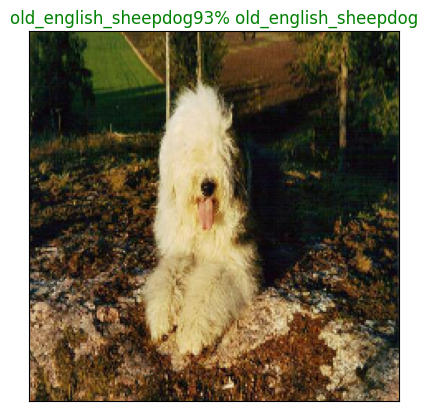

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,n=7)

In [ ]:
import numpy as np

def plot_pred_conf(prediction_probabilities, labels, n=1):
    pred_prob, true_label = prediction_probabilities[n], labels[n]
    pred_label = get_pred_label(pred_prob)
    top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

    top_10_pred_values = pred_prob[top_10_pred_indexes]

    top_10_pred_labels = np.unique(top_10_pred_indexes)

    top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                       top_10_pred_values,
                       color="grey")

    plt.xticks(np.arange(len(top_10_pred_labels)),
               labels=top_10_pred_labels,
               rotation="vertical")

    if np.isin(true_label, top_10_pred_labels):
        top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
    else:
        pass


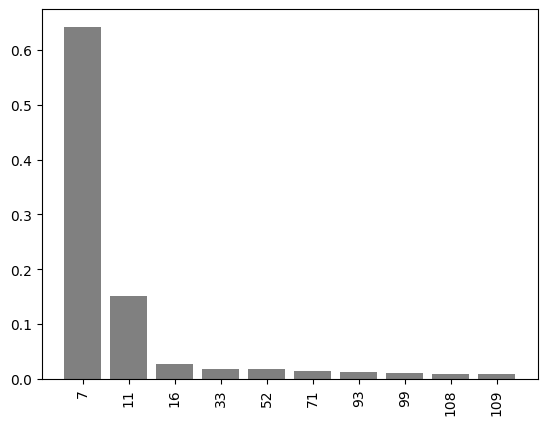

In [ ]:
plot_pred_conf(prediction_probabilities=predictions, labels=val_labels, n=9)


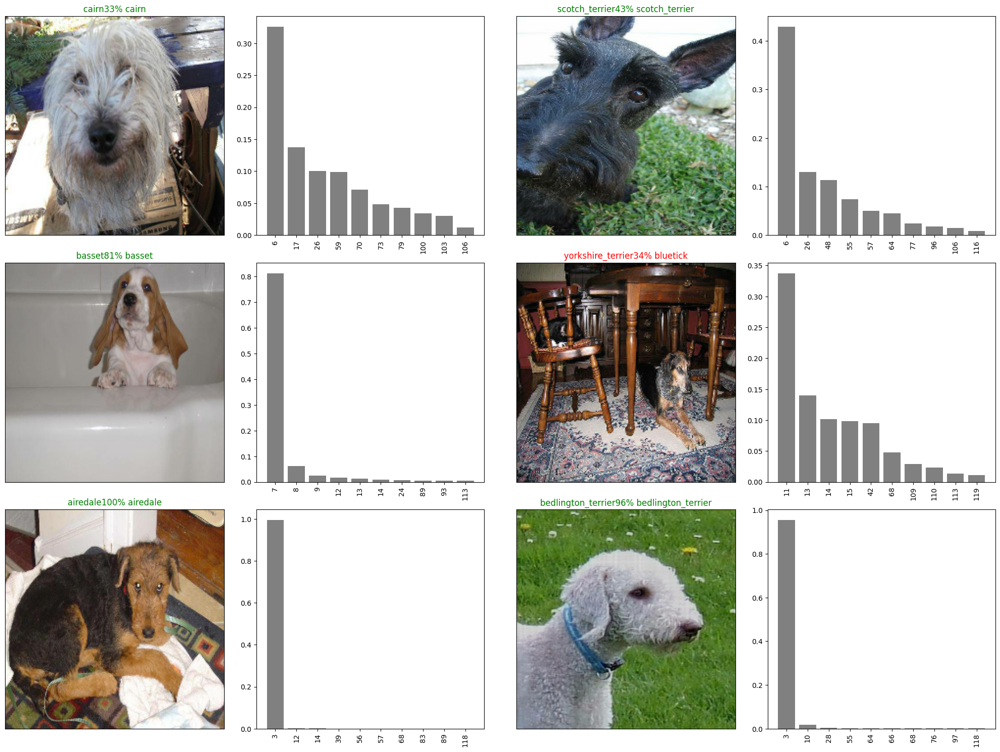

In [ ]:
i_multiplier=0
num_rows=3
num_cols=2
num_images=num_rows*num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows,2*num_cols,2*i+1)
  plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=i+i_multiplier)
  plt.subplot(num_rows,2*num_cols,2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()


## Saving and Loading model

In [ ]:
def save_model(model,suffix=None):
  modeldir=os.path.join("/content/drive/MyDrive/DOG/model",datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path=modeldir+"-"+suffix+".h5"
  print(f"Saving model to:{model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub

def load_model(model_path):
    print(f"Loading saved model: {model_path}")
    model = tf.keras.models.load_model(model_path, custom_objects={"KerasLayer": hub.KerasLayer})
    return model


In [ ]:

save_model(model,suffix="1000-images-mobilenetV2-Adam")

Saving model to:/content/drive/MyDrive/DOG/model/20230904-02051693793101-1000-images-mobilenetV2-Adam.h5...


'/content/drive/MyDrive/DOG/model/20230904-02051693793101-1000-images-mobilenetV2-Adam.h5'

In [ ]:
loaded_model=load_model("/content/drive/MyDrive/DOG/model/20230903-06041693721053-1000-images-mobilenetV2-Adam.h5")

Loading saved model: /content/drive/MyDrive/DOG/model/20230903-06041693721053-1000-images-mobilenetV2-Adam.h5


In [ ]:
model.evaluate(val_data)

7/7 [==============================] - 1s 84ms/step - loss: 1.2626 - accuracy: 0.6800


[1.2625542879104614, 0.6800000071525574]

## Training the model with full data

In [ ]:
full_data=create_data_batches(x,y)

Creating training data batches


In [ ]:
full_model=create_model()

Building model with : https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
full_model_tesnorboard=create_tesnorboard_callbacks()
full_model_early_stopping=tf.keras.callbacks.EarlyStopping(monitor="accuracy",patience=3)

In [ ]:
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tesnorboard,full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 39s 106ms/step - loss: 1.3423 - accuracy: 0.6754
Epoch 2/100
320/320 [==============================] - 34s 106ms/step - loss: 0.4052 - accuracy: 0.8811
Epoch 3/100
320/320 [==============================] - 34s 106ms/step - loss: 0.2365 - accuracy: 0.9353
Epoch 4/100
320/320 [==============================] - 35s 108ms/step - loss: 0.1569 - accuracy: 0.9630
Epoch 5/100
320/320 [==============================] - 33s 103ms/step - loss: 0.1061 - accuracy: 0.9780
Epoch 6/100
320/320 [==============================] - 33s 103ms/step - loss: 0.0763 - accuracy: 0.9882
Epoch 7/100
320/320 [==============================] - 33s 103ms/step - loss: 0.0603 - accuracy: 0.9904
Epoch 8/100
320/320 [==============================] - 33s 103ms/step - loss: 0.0471 - accuracy: 0.9941
Epoch 9/100
320/320 [==============================] - 33s 103ms/step - loss: 0.0370 - accuracy: 0.9969
Epoch 10/100
320/320 [==============================] - 34s 107m

In [ ]:
save_model(full_model,suffix="full-image-set-mobilenetv2-Adam")

Saving model to:/content/drive/MyDrive/DOG/model/20230904-02161693793813-full-image-set-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/DOG/model/20230904-02161693793813-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
loaded_full_model=load_model("/content/drive/MyDrive/DOG/model/20230903-07301693726205-full-image-set-mobilenetv2-Adam.h5")


Loading saved model: /content/drive/MyDrive/DOG/model/20230903-07301693726205-full-image-set-mobilenetv2-Adam.h5


## making prediction on the test data set

In [ ]:
test_path="/content/drive/MyDrive/DOG/test/dogbreed/"
test_filenames=[test_path+fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/DOG/test/dogbreed/18c6b3769a215ea325655dcc1b692c54.jpg',
 '/content/drive/MyDrive/DOG/test/dogbreed/17f4d165ec245786ddf2256a5c73c6e7.jpg',
 '/content/drive/MyDrive/DOG/test/dogbreed/1ae58bece7c59da6a8d6b479f4527f3d.jpg',
 '/content/drive/MyDrive/DOG/test/dogbreed/1beac5337b15d515fbbeb16139fcc646.jpg',
 '/content/drive/MyDrive/DOG/test/dogbreed/1b04182b865401f6f3e303c33d0f41a6.jpg',
 '/content/drive/MyDrive/DOG/test/dogbreed/1b410af3a3965265af9b4c1153d32630.jpg',
 '/content/drive/MyDrive/DOG/test/dogbreed/1c082570531b3fb68e82f06695d89de8.jpg',
 '/content/drive/MyDrive/DOG/test/dogbreed/1bd850d59f3d8a60e863bc2b6997ba09.jpg',
 '/content/drive/MyDrive/DOG/test/dogbreed/1c384dc39a96d27427315a5ee9d34c67.jpg',
 '/content/drive/MyDrive/DOG/test/dogbreed/1afeea9fb2189e022e751f209c9603a3.jpg']

In [ ]:

test_data=create_data_batches(test_filenames,test_data=True)


Create test data batches


In [ ]:
len(test_filenames)

2100

In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
test_predictions=loaded_full_model.predict(test_data,verbose=1)

66/66 [==============================] - 45s 631ms/step


In [ ]:
test_predictions=np.loadtxt("/content/drive/MyDrive/DOG/preds_array.csv",delimiter=",")

In [ ]:
test_predictions[:10]

array([[1.61196489e-09, 3.44086413e-12, 2.32834394e-11, ...,
        1.06917716e-13, 1.58530451e-08, 1.52161670e-06],
       [3.17894322e-10, 3.20088262e-14, 1.85374840e-10, ...,
        7.00588814e-08, 1.88822238e-08, 2.56980937e-10],
       [4.27301083e-09, 1.84139528e-13, 1.11784948e-09, ...,
        2.71949238e-12, 2.23927123e-06, 7.41860809e-11],
       ...,
       [4.47232779e-10, 4.28004029e-07, 4.11986996e-08, ...,
        4.65437893e-07, 8.21722967e-10, 8.86002116e-09],
       [3.50528079e-11, 1.94377336e-03, 1.44941642e-10, ...,
        1.56135718e-06, 6.13228721e-08, 7.32120961e-12],
       [1.23221771e-08, 3.08354520e-09, 1.87174110e-10, ...,
        8.16165635e-10, 9.98905063e-01, 6.73740752e-09]])

## Preparing test data set submission for kaggle

In [ ]:
preds_df=pd.DataFrame(columns=["id"]+list(unique_breeds))

In [ ]:
test_ids=[os.path.splitext(path)[0] for path in os.listdir(test_path)]
test_ids

['18c6b3769a215ea325655dcc1b692c54',
 '17f4d165ec245786ddf2256a5c73c6e7',
 '1ae58bece7c59da6a8d6b479f4527f3d',
 '1beac5337b15d515fbbeb16139fcc646',
 '1b04182b865401f6f3e303c33d0f41a6',
 '1b410af3a3965265af9b4c1153d32630',
 '1c082570531b3fb68e82f06695d89de8',
 '1bd850d59f3d8a60e863bc2b6997ba09',
 '1c384dc39a96d27427315a5ee9d34c67',
 '1afeea9fb2189e022e751f209c9603a3',
 '1bff026e041df7da298b1518d598f52e',
 '1bc409ac5789490d4698887b41865c87',
 '1a76f956fca627980c7f966eedb5af01',
 '1aaf4d6f85e841b44fcaf941efa65811',
 '1a9dde82974507429bea3890499c2ce3',
 '1ac0f98866f354ca8d0fc30a69b8f62b',
 '1ac21164108a8e28660675646428b795',
 '1ae997fa034dbf03ad61ffabbdfe4d9a',
 '1bae0e41174a2ea306752f40386cb492',
 '1b567e4dc46208a9d1fd051eb2416622',
 '1ae9fd85173a67c5dab6477a266db7ef',
 '1ac7185770a9329a56c8ba218b639108',
 '1be3650327dcff01488a0764353215ee',
 '1ad307a10f54496d506cae71fff3a8ce',
 '1ba6e093c8af25d01a3602382312c339',
 '1ab8fc6a95b85dd22b958ffb918d86d3',
 '1c16315c9efe0ea92a38cdd20aa9d624',
 

In [ ]:
preds_df["id"]=test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,18c6b3769a215ea325655dcc1b692c54,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,17f4d165ec245786ddf2256a5c73c6e7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1ae58bece7c59da6a8d6b479f4527f3d,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1beac5337b15d515fbbeb16139fcc646,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1b04182b865401f6f3e303c33d0f41a6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
np.shape(test_predictions)

(10357, 120)

In [ ]:
list[unique_breeds]

list[array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
 

## Making prediction on actual images


In [ ]:
custom_path="/content/drive/MyDrive/DOG/dog_p/"
custom_image_paths=[custom_path+fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['/content/drive/MyDrive/DOG/dog_p/images (1).jpeg',
 '/content/drive/MyDrive/DOG/dog_p/images.jpeg']

In [ ]:
custom_data=create_data_batches(custom_image_paths,test_data=True)
custom_data

Create test data batches


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
custom_preds=loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 634ms/step
